La finalidad de este notebook es imlementar un modelo híbrido, primero aplicando un modelo Ridge para hacer una predicción inicial y después empleando un modelo más complejo como un XGBoost para ajustar los residuos de forma que la predicción final sea la suma de la primera predicción yh la predicción de los residuos. Para ello, con el XGBoost se intentará captar todo aquello a lo que Ridge no llegue, para lo que se intentará entre otras cosas incluir más variables del resto de datasets que no se han empleado en la predicción inicial, cuya influencia en las ventas se va a analizar. Asimismo, se tendrá en cuenta también la inclusión en el modelo de los residuos de lag_features para tratar de ajustar en caso de presencia de patrones cíclicos atemporales. La dificultad que implica añadir estos lag features es que en test será información que aún no se posee, por lo que habrá que recurrir a una estrategia directa, calculando la salida hasta el día 16 de test únicamente a partir de la información que se tiene hasta el último día de training o mediante una estrategia recursiva en la que se la predicción en test se realice en un bucle de forma que se vaya calculando día a día y los resultados que se vayan obteniendo sean utilizados para iractrualizando los lag features

In [1]:
# Setup notebook
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, PolynomialFeatures

In [2]:
# plotly settings
plotly_base_params = {
    'template': "plotly_white",
    'title_font': dict(size=29, color='#8a8d93', family="Lato, sans-serif"),
    'font': dict(color='#8a8d93'), 
    'hoverlabel': dict(bgcolor="#f2f2f2", font_size=13, font_family="Lato, sans-serif")
}

In [5]:
store_sales = pd.read_csv('train.csv')
store_sales_test = pd.read_csv('test.csv')
oil = pd.read_csv('oil.csv', parse_dates=['date'])
holidays_events = pd.read_csv('holidays_events.csv', dtype={'type': 'category','locale': 'category',
                            'locale_name': 'category','description': 'category','transferred': 'bool',}, parse_dates=['date'], infer_datetime_format=True)
transactions = pd.read_csv('transactions.csv', parse_dates=['date'])
stores = pd.read_csv('stores.csv')

***Data Preprocessing***

In [6]:
store_sales['date'] = pd.to_datetime(store_sales['date'])
store_sales['date'] = store_sales.date.dt.to_period('D')
store_sales_test['date'] = pd.to_datetime(store_sales_test['date'])
store_sales_test['date'] = store_sales_test.date.dt.to_period('D')

transactions['date'] = pd.to_datetime(transactions['date'])
transactions['date'] = transactions.date.dt.to_period('D')

store_sales_ext = store_sales.merge(stores, on='store_nbr', how='left')
store_sales_ext = store_sales_ext.merge(transactions, on=['date', 'store_nbr'], how='left')

store_sales_ext['transactions'] = store_sales_ext.transactions.fillna(0.0)

Se va a proceder con el estudio de las variables

**Variables numéricas**

In [7]:
oil = oil.set_index('date').to_period('D')

In [8]:
Total_sales = store_sales.groupby('date').agg({"sales" : "sum","onpromotion" : "sum"}).reset_index()

Total_sales.set_index('date', inplace = True)
Total_sales = Total_sales.merge(oil, on='date', how = 'left')

#Para el precio del petróleo de los fines de semana se va a tomar el precio del viernes 
Total_sales['dcoilwtico'].ffill(inplace=True)
#Como el primer día es nan y no tiene un valor anterior que tomar, se va a introducir manualmente el valor del segundo día
Total_sales['dcoilwtico'].fillna(93.14, inplace=True)
#Se crea una columna del precio del petróleo multiplicado por 10^4 para que sea del orden de las ventas totales y poder visualizarlos juntos en una gráfica
Total_sales['dcoilwtico_greater'] = Total_sales['dcoilwtico']*10000

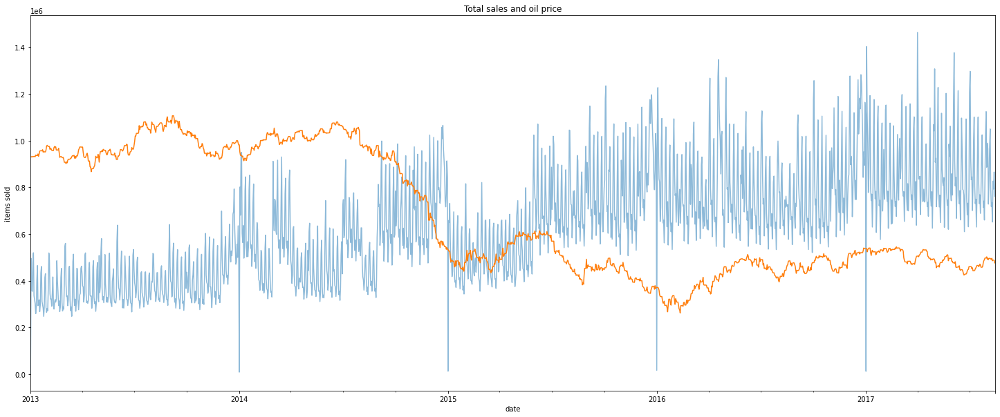

In [9]:
ax = Total_sales['sales'].plot(figsize = (25,10), alpha=0.5, title="Average Sales", ylabel="items sold")
ax = Total_sales['dcoilwtico_greater'].plot(ax=ax, label="Oil Price")
ax.set_title('Total sales and oil price');

Se observa que el precio del petróleo a partir del 2015 es ucho menor que en los 2 primeros años y coincide con un aumento delas ventas, si bien no se puede confirmar que haya una correlación directa, pues hay muchos otros factores que influyen en esta tendencia de las ventas

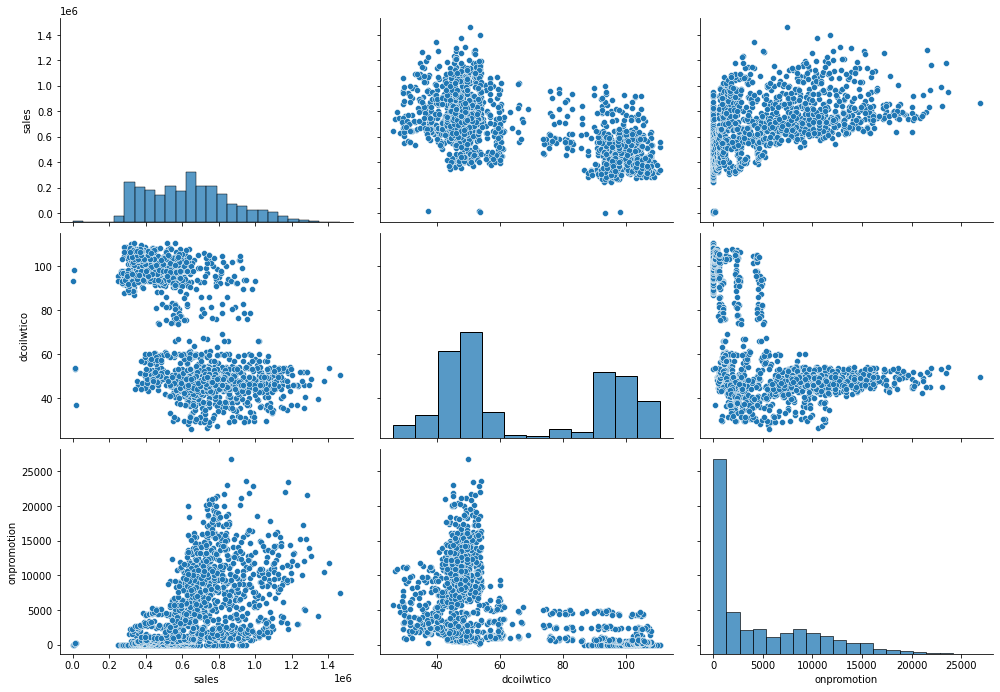

In [ ]:
variables = ['sales','dcoilwtico','onpromotion']
fig_pairplot = sns.pairplot(Total_sales[variables])
fig_pairplot.fig.set_size_inches(15, 10)

In [ ]:
inferior = Total_sales[Total_sales['dcoilwtico']<50]['sales'].mean()
superior = Total_sales[Total_sales['dcoilwtico']>=50]['sales'].mean()
print(f'La media de ventas cuando el precio del petróleo es inferior a 50$ es {inferior}, mientras que cuando es superior es {superior}')

La media de ventas cuando el precio del petróleo es inferior a 50$ es 765990.7371906015, mientras que cuando es superior es 550138.9914561664


In [ ]:
medio = np.sort(Total_sales['onpromotion'].unique())[int(len(Total_sales['onpromotion'].unique())/2)]
inferior = Total_sales[Total_sales['onpromotion']<medio]['sales'].mean()
superior = Total_sales[Total_sales['onpromotion']>=medio]['sales'].mean()
print(f'La media de ventas cuando el número de promociones totales es inferior a {medio} es {inferior}, mientras que cuando es superior es {superior}')

La media de ventas cuando el número de promociones totales es inferior a 5296 es 544645.7943803562, mientras que cuando es superior es 808938.7580062846


In [10]:
import plotly.express as px

fig = px.imshow(Total_sales[['dcoilwtico', 'sales', 'onpromotion']].corr(), color_continuous_scale='reds')
fig.update_layout(title='Correlation between Oil / Sales / onptomotion', height=400, width=700)

Se observa tanto una correlación directa de las ventas con las promociones en las tiendas como una inversa con el precio del petróleo

**Variables categóricas**

In [15]:
df = store_sales.groupby(['date', 'family']).agg({"sales" : "mean"})
df = df.unstack(level=0).T.droplevel(level=0, axis=0)
df.reset_index(inplace=True)
df['date']=df['date'].dt.to_timestamp()
df.set_index('date',inplace=True)


fig =  go.Figure()
for col in df.columns:
    fig.add_trace(go.Scatter(x=df.index, y=df[col], name=col, mode='lines'))
fig.update_layout(height=850,
                  title_text="Weekly moving average per product Family",
                  **plotly_base_params)
fig.show()

En el análisis por familias, se confirma lo  que se comenta en el tutorial, SCHOOL AND OFFICE SUPPLIES presenta ciclos. También llamativo, FROZEN FOODS, más allá de la temporalidad semanal de todas las familias, presenta picos enormes en diciembre. Grocery II hace algo similar.

**Holidays**

In [16]:
holidays_events = holidays_events.set_index('date').to_period('D')

In [17]:
holidays = (
    holidays_events
    .query("locale in ['National', 'Regional']")
    .loc['2013':'2017-08-15', ['type']]
)

display(holidays)

,type
date,
2013-01-01,Holiday
2013-01-05,Work Day
2013-01-12,Work Day
2013-02-11,Holiday
2013-02-12,Holiday
...,...
2017-05-24,Holiday
2017-05-26,Transfer
2017-06-25,Holiday


In [18]:
average_sales = store_sales.groupby('date').agg({"sales" : "mean"}).reset_index()
df_sales_holi = average_sales.merge(holidays, on='date', how = 'left')
df_sales_holi = df_sales_holi.rename(columns = {'type':'event_type'})

In [19]:
df_sales_holi

,date,sales,event_type
0,2013-01-01,1.409438,Holiday
1,2013-01-02,278.390807,NaN
2,2013-01-03,202.840197,NaN
3,2013-01-04,198.911154,NaN
4,2013-01-05,267.873244,Work Day
...,...,...,...
1684,2017-08-11,463.733851,Transfer
1685,2017-08-12,444.798280,NaN
1686,2017-08-13,485.768618,NaN
1687,2017-08-14,427.004717,NaN


In [ ]:
df_sales_holi.dtypes

date          period[D]
sales           float64
event_type     category
dtype: object

In [20]:
df_sales_holi['date'] = df_sales_holi['date'].dt.to_timestamp()

In [21]:
fig = go.Figure()
fig.add_scatter(x=df_sales_holi.date, y=df_sales_holi.sales,
                mode='lines', name='Avg Sales', line=dict(width=.5))
fig.add_scatter(x=df_sales_holi['date'][df_sales_holi.event_type == 'Holiday'],
                y=df_sales_holi['sales'][df_sales_holi.event_type=='Holiday'],
                mode='markers', name='Holidays',
                marker=dict(color='orange', size=4))
fig.add_scatter(x=df_sales_holi['date'][df_sales_holi.event_type=='Event'],
                y=df_sales_holi['sales'][df_sales_holi.event_type=='Event'],
                mode='markers', name='Events',
                marker=dict(color='purple', size=5))
fig.update_layout(title='Avg Sales with Holydays and Events',
                  height=500, width=1000, **plotly_base_params)
fig.show()

In [ ]:
holidays_events[holidays_events['type']=='Event'].loc['2016-04']

,type,locale,locale_name,description,transferred
date,,,,,
2016-04-16,Event,National,Ecuador,Terremoto Manabi,False
2016-04-17,Event,National,Ecuador,Terremoto Manabi+1,False
2016-04-18,Event,National,Ecuador,Terremoto Manabi+2,False
2016-04-19,Event,National,Ecuador,Terremoto Manabi+3,False
2016-04-20,Event,National,Ecuador,Terremoto Manabi+4,False
2016-04-21,Event,National,Ecuador,Terremoto Manabi+5,False
2016-04-22,Event,National,Ecuador,Terremoto Manabi+6,False
2016-04-23,Event,National,Ecuador,Terremoto Manabi+7,False
2016-04-24,Event,National,Ecuador,Terremoto Manabi+8,False


Para año nuevo, todas las tiendas cerradas.
En abril de 2016 tuvo lugar el terremoto, que de primeras implicó aumento de las ventas, con una vuelta a la normalidad posterior

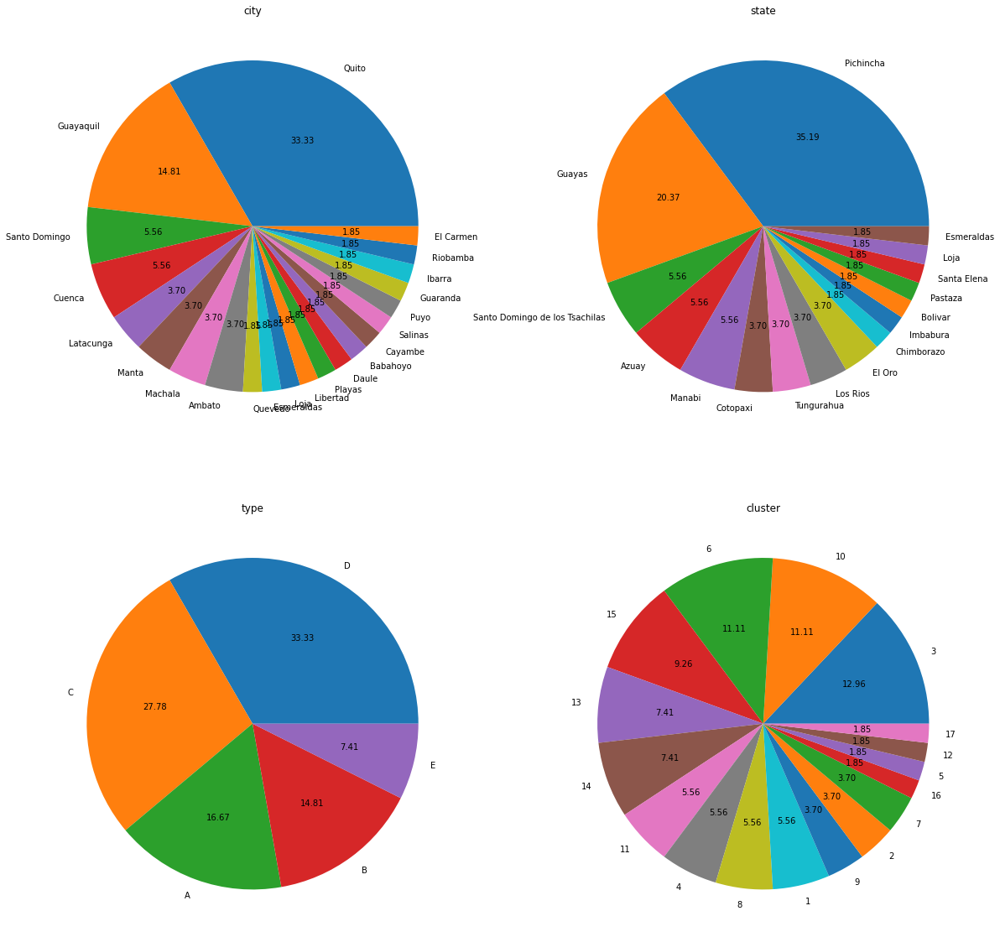

In [ ]:
list_categorical_variables = ["store_nbr", "family", "city", "state", "type", "cluster"]
fig, axes = plt.subplots(2, 2)
fig.set_size_inches(20, 20)
store_sales_ext["city"].value_counts().rename("").plot.pie(autopct='%.2f', ax=axes[0,0], title="city");
store_sales_ext["state"].value_counts().rename("").plot.pie(autopct='%.2f', ax=axes[0,1], title="state");
store_sales_ext["type"].value_counts().rename("").plot.pie(autopct='%.2f', ax=axes[1,0], title="type");
store_sales_ext["cluster"].value_counts().rename("").plot.pie(autopct='%.2f', ax=axes[1,1], title="cluster");

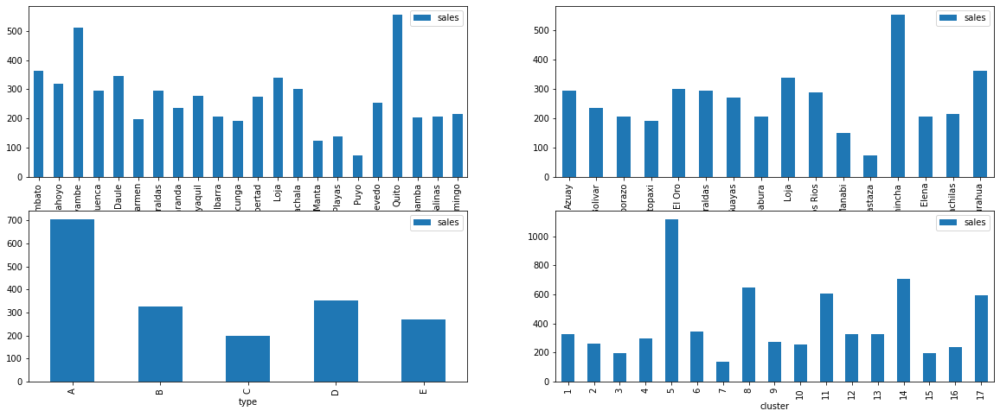

In [ ]:
fig, axes = plt.subplots(2, 2)
fig.set_size_inches(20, 8)
store_sales_ext[["city", "sales"]].groupby(by="city").mean().plot(kind="bar", ax=axes[0,0]);
store_sales_ext[["state", "sales"]].groupby(by="state").mean().plot(kind="bar", ax=axes[0,1]);
store_sales_ext[["type", "sales"]].groupby(by="type").mean().plot(kind="bar", ax=axes[1,0]);
store_sales_ext[["cluster", "sales"]].groupby(by="cluster").mean().plot(kind="bar", ax=axes[1,1]);

# **Modelo**



In [24]:
import warnings
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import make_scorer, r2_score, mean_squared_error
from sklearn.linear_model import Ridge, Lasso, LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor
from joblib import Parallel, delayed
import category_encoders as ce

Se va a volver a cargar todo limpio

In [6]:
oil = pd.read_csv('/content/drive/MyDrive/Kaggle Project/oil.csv', parse_dates=['date'])
holidays_events = pd.read_csv('/content/drive/MyDrive/Kaggle Project/holidays_events.csv', dtype={'type': 'category','locale': 'category',
                            'locale_name': 'category','description': 'category','transferred': 'bool',}, parse_dates=['date'], infer_datetime_format=True)
transactions = pd.read_csv('/content/drive/MyDrive/Kaggle Project/transactions.csv', parse_dates=['date'])
stores = pd.read_csv('/content/drive/MyDrive/Kaggle Project/stores.csv')

In [4]:
store_sales_train = pd.read_csv('train.csv')
store_sales_test = pd.read_csv('test.csv')
oil = pd.read_csv('oil.csv', parse_dates=['date'])
holidays_events = pd.read_csv('holidays_events.csv', dtype={'type': 'category','locale': 'category',
                            'locale_name': 'category','description': 'category','transferred': 'bool',}, parse_dates=['date'], infer_datetime_format=True)
transactions = pd.read_csv('transactions.csv', parse_dates=['date'])
stores = pd.read_csv('stores.csv')

In [5]:
store_sales_train['date'] = pd.to_datetime(store_sales_train['date'])
store_sales_train['date'] = store_sales_train.date.dt.to_period('D')
store_sales_test['date'] = pd.to_datetime(store_sales_test['date'])
store_sales_test['date'] = store_sales_test.date.dt.to_period('D')

In [6]:
store_sales_train_17 = store_sales_train.loc[(store_sales_train['date']>='2017-01-01') & (store_sales_train['date']<'2017-08-01')].set_index(['store_nbr', 'family', 'date']).sort_index()
store_sales_val_17 = store_sales_train.loc[store_sales_train['date']>='2017-08-01'].set_index(['store_nbr', 'family', 'date']).sort_index()

In [9]:
store_sales_train_17

id  sales  onpromotion
store_nbr family     date                                   
1         AUTOMOTIVE 2017-01-01  2596374    0.0            0
                     2017-01-02  2598156    5.0            0
                     2017-01-03  2599938    4.0            0
                     2017-01-04  2601720    1.0            0
                     2017-01-05  2603502    2.0            0
...                                  ...    ...          ...
54        SEAFOOD    2017-07-27  2966897    2.0            0
                     2017-07-28  2968679    4.0            0
                     2017-07-29  2970461    4.0            2
                     2017-07-30  2972243    4.0            0
                     2017-07-31  2974025    4.0            0

[377784 rows x 3 columns]

In [10]:
store_sales_val_17

id  sales  onpromotion
store_nbr family     date                                   
1         AUTOMOTIVE 2017-08-01  2974158    5.0            0
                     2017-08-02  2975940    4.0            0
                     2017-08-03  2977722    3.0            0
                     2017-08-04  2979504    8.0            0
                     2017-08-05  2981286    5.0            0
...                                  ...    ...          ...
54        SEAFOOD    2017-08-11  2993627    0.0            0
                     2017-08-12  2995409    1.0            1
                     2017-08-13  2997191    2.0            0
                     2017-08-14  2998973    0.0            0
                     2017-08-15  3000755    3.0            0

[26730 rows x 3 columns]

Se hace el primer ajuste haciendo uso del modelo Ridge. Se implementan los días de vacaciones nacionales únicamente, debido a que al emplearse el mismo DataFrame para predecir para todas las tiendas, no hay forma de introducir fiestas locales y regionales. Habría que trabajar de otra manera, como se acabará haciendo con el último modelo. Algo similar ocurre con las promociones

In [7]:
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess

y = store_sales_train_17.unstack(['store_nbr', 'family'])
y = y['sales']

fourier = CalendarFourier(freq="M", order=4)
dp = DeterministicProcess(
    index=y.index,
    constant=True,
    order=1,
    seasonal=True,
    additional_terms=[fourier],
    drop=True
)
X1 = dp.in_sample()

In [8]:
holidays_events = holidays_events.set_index('date').to_period('D')

holidays_17 = (
    holidays_events
    .query("locale in ['National']")
    .loc['2017':'2017-08-31', ['type','transferred']]
)

holidays_17.drop(holidays_17[holidays_17['transferred']==True].index,axis=0,inplace=True)
holidays_17.rename(columns = {'type':'event_type'}, inplace=True)

holidays_17.loc[holidays_17['event_type'].isin(['Holiday','Transfer','Additional', 'Bridge']),'Free_day']=1
holidays_17.loc[holidays_17['event_type'].isin(['Event']),'Event']=1
holidays_17['Free_day'].fillna(0,inplace=True)
holidays_17['Event'].fillna(0,inplace=True)

display(holidays_17)

,event_type,transferred,Free_day,Event
date,,,,
2017-01-02,Transfer,False,1.0,0.0
2017-02-27,Holiday,False,1.0,0.0
2017-02-28,Holiday,False,1.0,0.0
2017-04-14,Holiday,False,1.0,0.0
2017-05-01,Holiday,False,1.0,0.0
2017-05-13,Additional,False,1.0,0.0
2017-05-14,Event,False,0.0,1.0
2017-05-26,Transfer,False,1.0,0.0
2017-08-11,Transfer,False,1.0,0.0


In [9]:
X2 = X1.join(holidays_17[['Free_day','Event']], on='date').fillna(0.0)
X2['NewYear'] = (X2.index.dayofyear == 1)

In [10]:
model =Ridge(fit_intercept=False).fit(X2, y)
y_pred = pd.DataFrame(model.predict(X2), index=y.index, columns=y.columns)

In [11]:
X_val = dp.out_of_sample(steps=15)
X_val.index.names=['date']
X_val = X_val.join(holidays_17[['Free_day','Event']], on='date').fillna(0.0)
X_val['NewYear'] = (X_val.index.dayofyear == 1)
y_val = store_sales_val_17.unstack(['store_nbr', 'family'])
y_val = y_val['sales']

y_fore = pd.DataFrame(model.predict(X_val), index= y_val.index, columns=y_val.columns)

Se va a pasar a trabajar sobre los residuos

In [12]:
residuos = y-y_pred
residuos_val = y_val-y_fore
residuos_rows = pd.DataFrame(residuos.stack(['store_nbr', 'family']))
residuos_rows_val = pd.DataFrame(residuos_val.stack(['store_nbr', 'family']))
residuos_rows.rename(columns={'0':'residuos'}, inplace=True)
residuos_rows_val.rename(columns={'0':'residuos'}, inplace=True)
residuos_rows.reset_index(inplace=True)
residuos_rows_val.reset_index(inplace=True)

Estudio de los lags, como residuos totales agrupados

In [ ]:
Total_residuos = pd.DataFrame(residuos_rows.groupby('date').mean().squeeze())
Total_residuos

,0
date,
2017-01-01,-314.372001
2017-01-02,128.833600
2017-01-03,118.024507
2017-01-04,45.414302
2017-01-05,22.876245
...,...
2017-07-27,11.482052
2017-07-28,43.118253
2017-07-29,4.769163


In [ ]:
def lagplot(x, y=None, lag=1, standardize=False, ax=None, **kwargs):
    x_ = x.shift(lag)
    if standardize:
        x_ = (x_ - x_.mean()) / x_.std()
    if y is not None:
        y_ = (y - y.mean()) / y.std() if standardize else y
    else:
        y_ = x
    corr = y_.corr(x_)
    if ax is None:
        fig, ax = plt.subplots()
    scatter_kws = dict(
        alpha=0.75,
        s=3,
    )
    line_kws = dict(color='C3', )
    ax = sns.regplot(x=x_,
                     y=y_,
                     scatter_kws=scatter_kws,
                     line_kws=line_kws,
                     lowess=True,
                     ax=ax,
                     **kwargs)
    at = AnchoredText(
        f"{corr:.2f}",
        prop=dict(size="large"),
        frameon=True,
        loc="upper left",
    )
    at.patch.set_boxstyle("square, pad=0.0")
    ax.add_artist(at)
    ax.set(title=f"Lag {lag}", xlabel=x_.name, ylabel=y_.name)
    return ax

In [ ]:
def plot_lags(x, y=None, lags=6, nrows=1, lagplot_kwargs={}, **kwargs):
    kwargs.setdefault('nrows', nrows)
    kwargs.setdefault('ncols', math.ceil(lags / nrows))
    kwargs.setdefault('figsize', (kwargs['ncols'] * 2, nrows * 2 + 0.5))
    fig, axs = plt.subplots(sharex=True, sharey=True, squeeze=False, **kwargs)
    for ax, k in zip(fig.get_axes(), range(kwargs['nrows'] * kwargs['ncols'])):
        if k + 1 <= lags:
            ax = lagplot(x, y, lag=k + 1, ax=ax, **lagplot_kwargs)
            ax.set_title(f"Lag {k + 1}", fontdict=dict(fontsize=14))
            ax.set(xlabel="", ylabel="")
        else:
            ax.axis('off')
    plt.setp(axs[-1, :], xlabel=x.name)
    plt.setp(axs[:, 0], ylabel=y.name if y is not None else x.name)
    fig.tight_layout(w_pad=0.1, h_pad=0.1)
    return fig

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


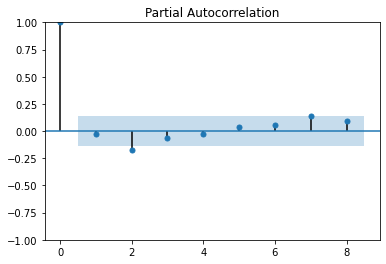

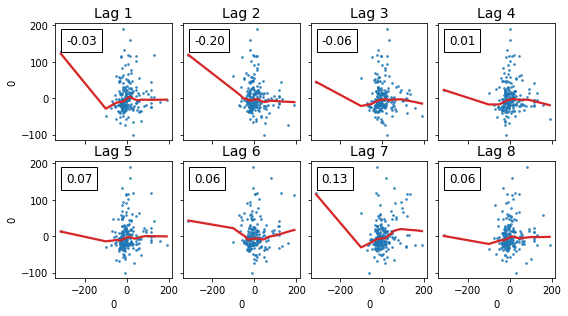

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf
plot_pacf(Total_residuos, lags=8);
plot_lags(Total_residuos[0], lags=8, nrows=2);

Al examinar la dependencia de los residuos con los valores de los residuos anteriores no se observa correlación (como mucho con el lag 2). Se va a observar lo mismo, por familias de producto, prestando especial atención en los casos de  SCHOOL AND OFFICE SUPPLIES, FROZEN FOODS y Grocery II, que son los que más presentaban un comportamiento cíclico.

In [246]:
familias = list(store_sales_train.family.unique())


 AUTOMOTIVE


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,



 BABY CARE


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,



 BEAUTY


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,



 BEVERAGES


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,



 BOOKS


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,



 BREAD/BAKERY


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,



 CELEBRATION


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,



 CLEANING


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,



 DAIRY


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,



 DELI


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,



 EGGS


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 FROZEN FOODS


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 GROCERY I


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 GROCERY II


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 HARDWARE


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 HOME AND KITCHEN I


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 HOME AND KITCHEN II


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 HOME APPLIANCES


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 HOME CARE


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 LADIESWEAR


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 LAWN AND GARDEN


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 LINGERIE


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 LIQUOR,WINE,BEER


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 MAGAZINES


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 MEATS


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 PERSONAL CARE


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 PET SUPPLIES


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 PLAYERS AND ELECTRONICS


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 POULTRY


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 PREPARED FOODS


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 PRODUCE


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 SCHOOL AND OFFICE SUPPLIES


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


 SEAFOOD


/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

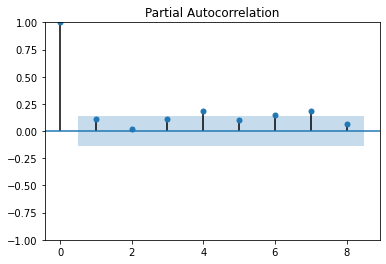

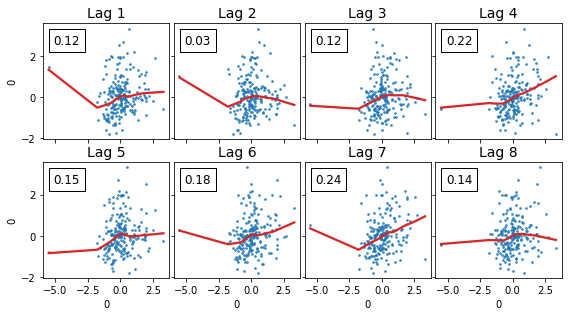

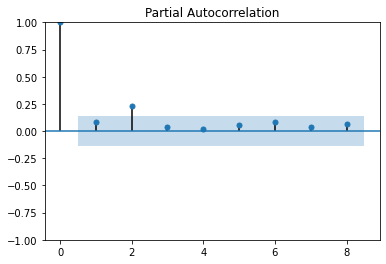

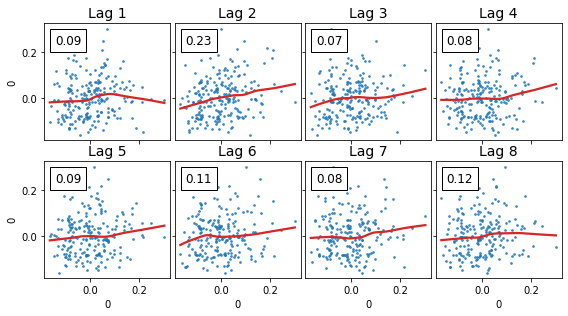

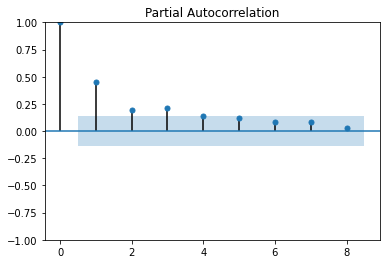

...

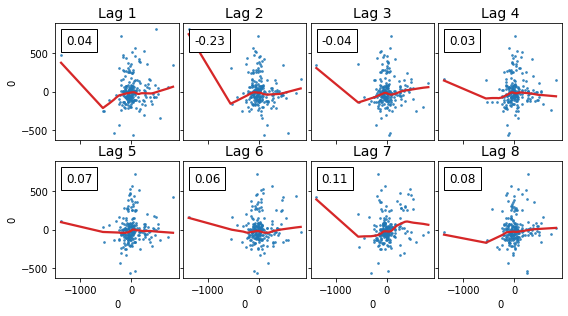

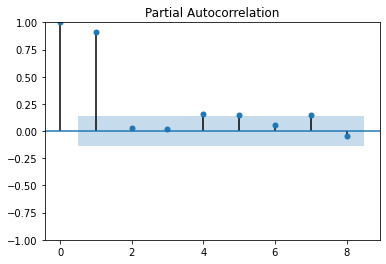

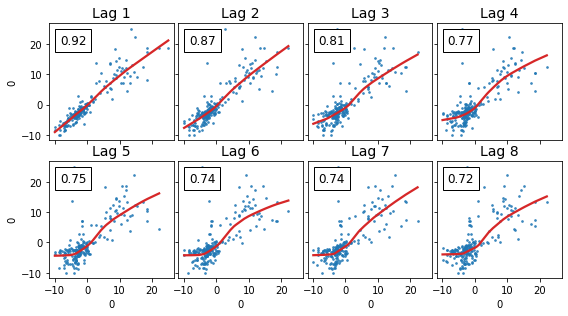

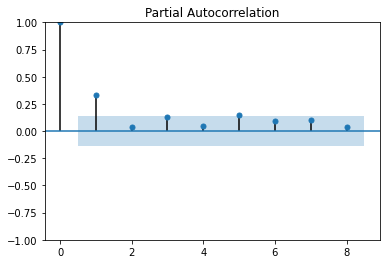

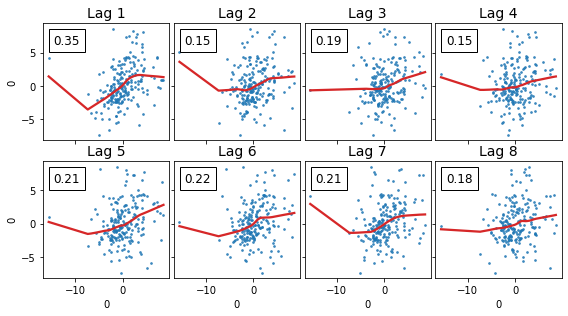

In [ ]:
residuos_familias = pd.DataFrame(residuos_rows.groupby(['date', 'family']).mean().squeeze()).reset_index()
for familia in familias:
  print('\n', familia)
  plot_pacf(residuos_familias[residuos_familias['family']==familia].set_index('date')[0], lags=8)
  plot_lags(residuos_familias[residuos_familias['family']==familia].set_index('date')[0], lags=8, nrows=2)


In [ ]:
familias

Se crea un diccionario con los lagas a tener en cuenta para cada familia para ajustar los residuos

In [14]:
imp_lags = {'AUTOMOTIVE': [4,6,7],
'BABY CARE':[2],
'BEAUTY': [1,2,3],
'BEVERAGES':[7],
'BOOKS':[1,4,5],
'BREAD/BAKERY':[2,7],
'CLEANING':[1],
'DAIRY':[2,7],
'DELI':[2,7],
'EGGS': [2,7],
'FROZEN FOODS': [1],
'GROCERY I':[2],
'GROCERY II':[1,5],
'HARDWARE': [5,6],
'HOME AND KITCHEN I':[1,2],
'HOME AND KITCHEN II':[1,2,3],
'HOME APPLIANCES':[1,2,3,5,6],
'HOME CARE':[5,7],
'LADIESWEAR':[2,7],
'LAWN AND GARDEN':[1,2],
'LINGERIE':[1,2,5],
'LIQUOR,WINE,BEER':[1,2,6],
'MAGAZINES':[1,6],
'MEATS':[5],
'PLAYERS AND ELECTRONICS':[7],
'POULTRY':[5],
'PREPARED FOODS':[1,7],
'PRODUCE':[2],
'SCHOOL AND OFFICE SUPPLIES':[1,4,5,7],
'SEAFOOD':[1,3,5]}

En este modelo también se van a tener en cuenta las promociones

In [15]:
promotions = pd.DataFrame(store_sales_train_17['onpromotion'])
promotions.reset_index(inplace=True)

In [16]:
residuos_rows.reset_index(inplace=True)
residuos_rows.rename(columns={0:'residuos'},inplace=True)
residuos_rows['date'] = residuos_rows['date'].dt.to_timestamp()
promotions['date'] = promotions['date'].dt.to_timestamp()
residuos_train = residuos_rows.merge(promotions, on=['date' ,'store_nbr','family'],how='left').fillna(0.0)
residuos_train = residuos_train.merge(stores, on=['store_nbr'],how='left').fillna(0.0)

In [17]:
residuos_rows_val.reset_index(inplace=True)
residuos_rows_val.rename(columns={0:'residuos'},inplace=True)
residuos_rows_val['date'] = residuos_rows_val['date'].dt.to_timestamp()
residuos_val = residuos_rows_val.merge(promotions, on=['date' ,'store_nbr','family'],how='left').fillna(0.0)
residuos_val = residuos_val.merge(stores, on=['store_nbr'],how='left').fillna(0.0)

Y las vacaciones y eventos regionales o locales

In [18]:
holidays_17_reg = (
    holidays_events
    .query("locale in ['Regional']")
    .loc['2017':'2017-08-31', ['type','locale_name','transferred']]
)

holidays_17_loc = (
    holidays_events
    .query("locale in ['Local']")
    .loc['2017':'2017-08-31', ['type','locale_name','transferred']]
)

holidays_17_reg.drop(holidays_17_reg[holidays_17_reg['transferred']==True].index,axis=0,inplace=True)
holidays_17_loc.drop(holidays_17_loc[holidays_17_loc['transferred']==True].index,axis=0,inplace=True)

holidays_17_reg.rename(columns = {'type':'event_type'}, inplace=True)
holidays_17_loc.rename(columns = {'type':'event_type'}, inplace=True)

holidays_17_reg.loc[holidays_17_reg['event_type'].isin(['Holiday','Transfer','Additional', 'Bridge']),'Free_day']=1
holidays_17_loc.loc[holidays_17_loc['event_type'].isin(['Holiday','Transfer','Additional', 'Bridge']),'Free_day']=1

#No hay eventos locales ni regionales
#holidays_17_reg.loc[holidays_17_reg['event_type'].isin(['Event']),'Event']=1
#holidays_17_loc.loc[holidays_17_loc['event_type'].isin(['Event']),'Event']=1

#holidays_17_reg['Event'].fillna(0,inplace=True)
#holidays_17_loc['Event'].fillna(0,inplace=True)

holidays_17_reg['Free_day'].fillna(0,inplace=True)
holidays_17_loc['Free_day'].fillna(0,inplace=True)

holidays_17_reg.drop(['event_type','transferred'],axis=1,inplace=True)
holidays_17_loc.drop(['event_type','transferred'],axis=1,inplace=True)

holidays_17_reg['locale_name']=holidays_17_reg['locale_name'].astype('object')
holidays_17_loc['locale_name']=holidays_17_loc['locale_name'].astype('object')

In [19]:
residuos_train = residuos_train.merge(holidays_17_reg, left_on=['date','state'], right_on=['date','locale_name'], how='left').fillna(0.0)
residuos_train = residuos_train.merge(holidays_17_loc, left_on=['date','city'], right_on=['date','locale_name'],how='left').fillna(0.0)

residuos_val = residuos_val.merge(holidays_17_reg, left_on=['date','state'], right_on=['date','locale_name'], how='left').fillna(0.0)
residuos_val = residuos_val.merge(holidays_17_loc, left_on=['date','city'], right_on=['date','locale_name'],how='left').fillna(0.0)

In [20]:
residuos_train['Free_day'] = residuos_train['Free_day_x'] + residuos_train['Free_day_y']
residuos_train.drop(['index', 'city','state','locale_name_x','Free_day_x','locale_name_y','Free_day_y'], axis=1, inplace=True)
residuos_val['Free_day'] = residuos_val['Free_day_x'] + residuos_val['Free_day_y']
residuos_val.drop(['index', 'city','state','locale_name_x','Free_day_x','locale_name_y','Free_day_y'], axis=1, inplace=True)

In [21]:
residuos_train

,date,store_nbr,family,residuos,onpromotion,type,cluster,Free_day
0,2017-01-01,1,AUTOMOTIVE,-1.219956,0,D,13,0.0
1,2017-01-01,1,BABY CARE,0.000000,0,D,13,0.0
2,2017-01-01,1,BEAUTY,-1.202564,0,D,13,0.0
3,2017-01-01,1,BEVERAGES,-659.003229,0,D,13,0.0
4,2017-01-01,1,BOOKS,-0.305576,0,D,13,0.0
...,...,...,...,...,...,...,...,...
377779,2017-07-31,54,POULTRY,29.205526,1,C,3,0.0
377780,2017-07-31,54,PREPARED FOODS,4.390941,0,C,3,0.0
377781,2017-07-31,54,PRODUCE,8.431218,4,C,3,0.0
377782,2017-07-31,54,SCHOOL AND OFFICE SUPPLIES,-3.406686,0,C,3,0.0


In [22]:
residuos_val

,date,store_nbr,family,residuos,onpromotion,type,cluster,Free_day
0,2017-08-01,1,AUTOMOTIVE,-0.264103,0.0,D,13,0.0
1,2017-08-01,1,BABY CARE,0.000000,0.0,D,13,0.0
2,2017-08-01,1,BEAUTY,-0.071441,0.0,D,13,0.0
3,2017-08-01,1,BEVERAGES,283.909891,0.0,D,13,0.0
4,2017-08-01,1,BOOKS,-0.433838,0.0,D,13,0.0
...,...,...,...,...,...,...,...,...
26725,2017-08-15,54,POULTRY,-14.785841,0.0,C,3,0.0
26726,2017-08-15,54,PREPARED FOODS,5.193466,0.0,C,3,0.0
26727,2017-08-15,54,PRODUCE,-49.118455,0.0,C,3,0.0
26728,2017-08-15,54,SCHOOL AND OFFICE SUPPLIES,-0.519891,0.0,C,3,0.0


In [25]:
ohencoder = ce.OneHotEncoder(cols='type', use_cat_names=True)

residuos_train = ohencoder.fit_transform(residuos_train)
residuos_val = ohencoder.transform(residuos_val)

In [26]:
residuos_train['date'] = pd.to_datetime(residuos_train['date'])
residuos_train['date'] = residuos_train.date.dt.to_period('D')

residuos_val['date'] = residuos_val.date.dt.to_period('D')


In [27]:
residuos_train.set_index('date',inplace=True)
residuos_train['dayofweek'] = residuos_train.index.dayofweek
residuos_train['dayofmonth'] = residuos_train.index.day

residuos_val.set_index('date',inplace=True)
residuos_val['dayofweek'] = residuos_val.index.dayofweek
residuos_val['dayofmonth'] = residuos_val.index.day

In [28]:
residuos_train

,store_nbr,family,residuos,onpromotion,type_D,type_B,type_C,type_E,type_A,cluster,Free_day,dayofweek,dayofmonth
date,,,,,,,,,,,,,
2017-01-01,1,AUTOMOTIVE,-1.219956,0,1,0,0,0,0,13,0.0,6,1
2017-01-01,1,BABY CARE,0.000000,0,1,0,0,0,0,13,0.0,6,1
2017-01-01,1,BEAUTY,-1.202564,0,1,0,0,0,0,13,0.0,6,1
2017-01-01,1,BEVERAGES,-659.003229,0,1,0,0,0,0,13,0.0,6,1
2017-01-01,1,BOOKS,-0.305576,0,1,0,0,0,0,13,0.0,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-07-31,54,POULTRY,29.205526,1,0,0,1,0,0,3,0.0,0,31
2017-07-31,54,PREPARED FOODS,4.390941,0,0,0,1,0,0,3,0.0,0,31
2017-07-31,54,PRODUCE,8.431218,4,0,0,1,0,0,3,0.0,0,31


In [29]:
residuos_val

,store_nbr,family,residuos,onpromotion,type_D,type_B,type_C,type_E,type_A,cluster,Free_day,dayofweek,dayofmonth
date,,,,,,,,,,,,,
2017-08-01,1,AUTOMOTIVE,-0.264103,0.0,1,0,0,0,0,13,0.0,1,1
2017-08-01,1,BABY CARE,0.000000,0.0,1,0,0,0,0,13,0.0,1,1
2017-08-01,1,BEAUTY,-0.071441,0.0,1,0,0,0,0,13,0.0,1,1
2017-08-01,1,BEVERAGES,283.909891,0.0,1,0,0,0,0,13,0.0,1,1
2017-08-01,1,BOOKS,-0.433838,0.0,1,0,0,0,0,13,0.0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-15,54,POULTRY,-14.785841,0.0,0,0,1,0,0,3,0.0,1,15
2017-08-15,54,PREPARED FOODS,5.193466,0.0,0,0,1,0,0,3,0.0,1,15
2017-08-15,54,PRODUCE,-49.118455,0.0,0,0,1,0,0,3,0.0,1,15


In [30]:
residuos = pd.concat([residuos_train,residuos_val])

Se van a crear los lags de los residuos que influyen para cada familia, e igualmente, lags y leads de las promociones en cada tienda. Por otro lado, con perspectiva de trabajar con la estrategia directa, de forma que se obtendrá el resultado para los siguientes 16 días e una única iteración, se van a crear leads de las promociones para todos estos días. En realidad, al trabajar con la estrategia directa, ¡los lags de los residuos con los que se trabaja dejan de ser los realmente influyentes más allá del primer día!

In [31]:
residuos_dict = {}

for familia in familias:
    residuos_dict[familia] = pd.DataFrame(residuos[residuos['family']==familia].reset_index().set_index(['store_nbr', 'date']).sort_index())

In [32]:
def make_lags_residuos(ts, lags):
    return pd.concat(
        {
            f'y_lag_residuos_{i}': ts.shift(i)
            for i in lags
        },
        axis=1)

In [86]:
lags_resi_dict = {}
for familia in imp_lags.keys():
    lags_resi_dict[familia]=make_lags_residuos(residuos_dict[familia].residuos, lags = imp_lags[familia])

In [87]:
for familia in imp_lags.keys():
    residuos_dict[familia] = residuos_dict[familia].join(lags_resi_dict[familia])

In [33]:
def make_lags_promotions(ts, lags):
    return pd.concat(
        {
            f'y_lag_promotions_{i}': ts.shift(i)
            for i in range(1, lags + 1)
        },
        axis=1)
def make_leads_promotions(ts, leads):
    return pd.concat(
        {
            f'y_lead_promotions_{i}': ts.shift(-i)
            for i in range(1, leads + 1)
        },
        axis=1)

In [89]:
lags_promo_dict = {}
leads_promo_dict = {}
for familia in familias:
    lags_promo_dict[familia]=make_lags_promotions(residuos_dict[familia].onpromotion, lags = 3)
    leads_promo_dict[familia]=make_leads_promotions(residuos_dict[familia].onpromotion, leads = 15).fillna(0)

In [94]:
for familia in familias:
    residuos_dict[familia] = residuos_dict[familia].join(lags_promo_dict[familia])
    residuos_dict[familia] = residuos_dict[familia].join(leads_promo_dict[familia])
    residuos_dict[familia].reset_index(inplace=True)

In [97]:
residuos_train_dict = {}
residuos_val_dict = {}
for familia in familias:
    residuos_train_dict[familia] = residuos_dict[familia].loc[residuos_dict[familia]['date']<'2017-08-01']
    residuos_val_dict[familia] = residuos_dict[familia].loc[residuos_dict[familia]['date']>='2017-08-01']

Se van a eliminar de todos los datasets las 8 primeras fechas, porque en ellas se habrán cogido valores para los lag features correspondientes a otras tiendas, dado que están concatenadas en el DataFrame de cada familia. En cualquier caso, son fechas para las que no se tienen datos.

In [99]:
for familia in familias:
    residuos_train_dict[familia] = residuos_train_dict[familia][residuos_train_dict[familia]['date']>'2017-01-08']
    residuos_train_dict[familia] = residuos_train_dict[familia].set_index(['store_nbr','date']).sort_index()
    residuos_val_dict[familia] = residuos_val_dict[familia].set_index(['store_nbr','date']).sort_index()

# Modelos para ajustar los residuos

In [101]:
from sklearn.multioutput import RegressorChain, MultiOutputRegressor
from xgboost import XGBRegressor
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

Se va a crear un dataset Y con multistep, de forma que en una única iteración se calculen los resultados para todos los días de validación

In [123]:
y_train_dict = {}
y_val_dict = {}
for familia in familias:
    y_train_dict[familia] = pd.DataFrame(residuos_train_dict[familia]['residuos'])
    y_val_dict[familia] = pd.DataFrame(residuos_val_dict[familia]['residuos'])

In [103]:
def make_multistep_target(ts, steps):
    return pd.concat(
        {
            f'y_step_{i}': ts.shift(-i)
            for i in range(1, steps + 1)
        },
        axis=1)

In [124]:
multi_steps_dict = {}
multi_steps_val_dict = {}

for familia in familias:
    multi_steps_dict[familia] = make_multistep_target(y_train_dict[familia], steps=14)
    multi_steps_val_dict[familia] = make_multistep_target(y_val_dict[familia], steps=14)
    y_train_dict[familia] = y_train_dict[familia].join(multi_steps_dict[familia])
    y_val_dict[familia] = y_val_dict[familia].join(multi_steps_val_dict[familia])

Se procede a eliminar las 14 últimas fechas del dataset de train, ya que al hacer el multistep han cogido datos del test de validación que realmente no se conocía y además, no hacen falta al trabajar con multioutput para rpedecir hasta el último día del dataset de train. Se hará lo propio con el dataset de validación.

In [126]:
y_val_dict['AUTOMOTIVE'].loc[(54,'2017-08-01'),:]

,,residuos,"(y_step_1, residuos)","(y_step_2, residuos)","(y_step_3, residuos)","(y_step_4, residuos)","(y_step_5, residuos)","(y_step_6, residuos)","(y_step_7, residuos)","(y_step_8, residuos)","(y_step_9, residuos)","(y_step_10, residuos)","(y_step_11, residuos)","(y_step_12, residuos)","(y_step_13, residuos)","(y_step_14, residuos)"
store_nbr,date,,,,,,,,,,,,,,,
54,2017-08-01,-1.654215,-3.48025,-2.922653,-1.305716,-0.746826,2.244218,-3.529233,-1.289066,0.406253,2.303838,5.822264,2.91505,7.01997,-2.750551,0.68705


In [127]:
for familia in familias:
    y_train_dict[familia] = y_train_dict[familia].reset_index()
    y_train_dict[familia] = y_train_dict[familia][y_train_dict[familia]['date']<'2017-07-18']
    y_val_dict[familia] = y_val_dict[familia].reset_index()
    y_val_dict[familia] = y_val_dict[familia][y_val_dict[familia]['date']<'2017-08-02']


In [128]:
for familia in familias:
    y_train_dict[familia] = y_train_dict[familia].set_index(['store_nbr','date']).sort_index()
    y_val_dict[familia] = y_val_dict[familia].set_index(['store_nbr','date']).sort_index()

In [129]:
for familia in familias:
    residuos_train_dict[familia] = residuos_train_dict[familia].reset_index()
    residuos_train_dict[familia]['tienda'] = residuos_train_dict[familia]['store_nbr']
    residuos_train_dict[familia] = residuos_train_dict[familia].set_index(['store_nbr','date']).sort_index()

    residuos_val_dict[familia] = residuos_val_dict[familia].reset_index()
    residuos_val_dict[familia]['tienda'] = residuos_val_dict[familia]['store_nbr']
    residuos_val_dict[familia] = residuos_val_dict[familia].set_index(['store_nbr','date']).sort_index()

In [131]:
X_train_dict = {}
X_val_dict = {}

for familia in familias:
    X_train_dict[familia] = residuos_train_dict[familia].drop(['family','residuos'],axis=1)
    X_val_dict[familia] = residuos_val_dict[familia].drop(['family','residuos'],axis=1)

In [132]:
for familia in familias:
    y_train_dict[familia], X_train_dict[familia] = y_train_dict[familia].align(X_train_dict[familia], join='inner', axis=0)
    y_val_dict[familia], X_val_dict[familia] = y_val_dict[familia].align(X_val_dict[familia], join='inner', axis=0)

In [134]:
X_val_dict['AUTOMOTIVE']

,,onpromotion,type_D,type_B,type_C,type_E,type_A,cluster,Free_day,dayofweek,dayofmonth,...,y_lead_promotions_7,y_lead_promotions_8,y_lead_promotions_9,y_lead_promotions_10,y_lead_promotions_11,y_lead_promotions_12,y_lead_promotions_13,y_lead_promotions_14,y_lead_promotions_15,tienda
store_nbr,date,,,,,,,,,,,,,,,,,,,,,
1,2017-08-01,0.0,1,0,0,0,0,13,0.0,1,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,2017-08-01,0.0,1,0,0,0,0,13,0.0,1,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
3,2017-08-01,0.0,1,0,0,0,0,8,0.0,1,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
4,2017-08-01,0.0,1,0,0,0,0,9,0.0,1,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4
5,2017-08-01,0.0,1,0,0,0,0,4,0.0,1,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
6,2017-08-01,0.0,1,0,0,0,0,13,0.0,1,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6
7,2017-08-01,0.0,1,0,0,0,0,8,0.0,1,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7
8,2017-08-01,0.0,1,0,0,0,0,8,0.0,1,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8
9,2017-08-01,0.0,0,1,0,0,0,6,0.0,1,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9


In [136]:
y_val_dict['AUTOMOTIVE']

,,residuos,"(y_step_1, residuos)","(y_step_2, residuos)","(y_step_3, residuos)","(y_step_4, residuos)","(y_step_5, residuos)","(y_step_6, residuos)","(y_step_7, residuos)","(y_step_8, residuos)","(y_step_9, residuos)","(y_step_10, residuos)","(y_step_11, residuos)","(y_step_12, residuos)","(y_step_13, residuos)","(y_step_14, residuos)"
store_nbr,date,,,,,,,,,,,,,,,
1,2017-08-01,-0.264103,-1.743659,-2.828941,0.884191,-0.686352,3.179602,2.541802,-0.150793,2.527128,4.213656,-3.048134,0.350698,-2.157181,-3.896848,-0.399296
2,2017-08-01,-3.483009,1.088328,-6.379190,3.194874,0.979342,2.717199,-3.377522,-0.382368,5.838140,4.019834,7.664898,0.051382,2.615234,-0.968085,-2.648586
3,2017-08-01,15.321618,-0.741404,2.085825,-2.082697,-5.548258,1.099872,1.934374,5.376715,-4.916474,-5.640751,-0.505327,-7.095476,1.572425,-0.557862,5.824708
4,2017-08-01,0.207258,3.748835,-2.577035,-1.128976,-0.426054,3.213408,1.279292,1.979816,1.714546,2.040895,-4.060351,-2.504118,0.416596,-0.787085,4.135698
5,2017-08-01,3.019342,-1.603588,-4.998168,1.486277,-1.641385,2.542843,-3.951163,0.846543,-4.209897,-0.087120,4.674922,-7.051894,7.132197,-0.671364,2.553681
6,2017-08-01,2.052274,9.325486,1.496509,7.989958,-2.965564,-0.420636,1.776052,-0.252284,1.020629,1.916932,-1.762736,-1.082936,3.406026,6.499324,2.318092
7,2017-08-01,5.384728,-1.159490,-1.998571,0.919976,-3.311635,-2.229507,2.601785,-4.060230,-1.455508,-1.914185,-5.927222,5.159584,-2.968101,-1.482666,0.251329
8,2017-08-01,-0.870623,-0.543549,-1.150911,-4.370359,4.562439,1.707298,-4.598489,1.273900,-2.576608,1.515440,-1.105217,-2.854557,-3.536808,0.111102,-0.956492
9,2017-08-01,3.655337,2.664791,6.993989,5.501055,9.232173,1.712967,-5.366115,-1.607308,2.083616,1.526488,1.990827,-8.356211,-1.530575,-5.042536,1.512949


# **Modelos sin lags de los residuos**

Primero se va a hacer un modelo común para todas las familias, sin tener en cuenta lags, para lo que se va a usar el dataset de residuos_train añadiendo un par de lags y un par de leads para la columna de promociones y etiquetando las familias con números

In [ ]:
residuos_train

,store_nbr,family,residuos,onpromotion,dayofweek,dayofmonth
date,,,,,,
2017-01-01,1,AUTOMOTIVE,-0.793873,0,6,1
2017-01-01,1,BABY CARE,0.000000,0,6,1
2017-01-01,1,BEAUTY,-0.454512,0,6,1
2017-01-01,1,BEVERAGES,-330.532238,0,6,1
2017-01-01,1,BOOKS,-0.165977,0,6,1
...,...,...,...,...,...,...
2017-07-31,54,POULTRY,27.406535,1,0,31
2017-07-31,54,PREPARED FOODS,1.940385,0,0,31
2017-07-31,54,PRODUCE,-6.357818,4,0,31


In [ ]:
residuos_train = residuos_train.reset_index().set_index(['store_nbr', 'family', 'date']).sort_index()
lags_promotion = make_lags_promotions(residuos_train.onpromotion, lags = 3)
leads_promotion = make_leads_promotions(residuos_train.onpromotion, leads = 3)
residuos_train = residuos_train.join(lags_promotion)
residuos_train = residuos_train.join(leads_promotion)
residuos_train.reset_index(inplace=True)
residuos_train.set_index('date', inplace=True)
#Para los lags y leads de las promociones de los que realmente no había información, se asume 0 promociones, que es lo mayoritario
residuos_train.loc['2017-01-01','y_lag_promotions_1':'y_lag_promotions_3']=0
residuos_train.loc['2017-01-02','y_lag_promotions_2':'y_lag_promotions_3']=0
residuos_train.loc['2017-01-03','y_lag_promotions_3']=0
residuos_train.loc['2017-07-31','y_lead_promotions_1':'y_lead_promotions_3']=0
residuos_train.loc['2017-07-30','y_lead_promotions_2':'y_lead_promotions_3']=0
residuos_train.loc['2017-07-29','y_lead_promotions_3']=0

In [ ]:
residuos_train.drop('index',axis=1,inplace=True)

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
residuos_train['family'] = le.fit_transform(residuos_train['family'])

In [ ]:
X_train = residuos_train.drop('residuos',axis=1)
Y_train = pd.DataFrame(residuos_train['residuos'])

In [ ]:
dict_params = {"n_estimators": [100,150, 200],
               "max_depth": [5, 10, 15],
               "learning_rate": [0.01, 0.03, 0.05],
               "objective": ["reg:squarederror"],
               "tree_method": ["hist"],
               "subsample": [0.6],
              }

In [ ]:
model_XGB = GridSearchCV(estimator=XGBRegressor(random_state=50),
                         param_grid=dict_params,
                         refit=True,
                         verbose=1,
                         n_jobs=-1,
                         return_train_score=True,
                         scoring="neg_mean_squared_error"
                         )

In [ ]:
model_XGB2.fit(X_train, Y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


In [ ]:
print(model_XGB.best_params_)

{'learning_rate': 0.03, 'max_depth': 10, 'n_estimators': 150, 'objective': 'reg:squarederror', 'subsample': 0.6, 'tree_method': 'hist'}


In [ ]:
y_train_preds_xgb = pd.DataFrame(model_XGB.predict(X_train), index=Y_train.index, columns=Y_train.columns)

In [ ]:
from sklearn.metrics import mean_squared_error

In [ ]:
mean_squared_error(Y_train,y_train_preds_xgb)

25981.511376863993

In [ ]:
dict_params = {"n_estimators": [100, 150, 200],
               "max_depth": [5, 10, 15],
               "criterion": ["mse"],
               "max_features": [None],
               "bootstrap": [True],
               "oob_score": [True],
               "max_samples": [0.6]
              }

In [ ]:
model_RF = GridSearchCV(estimator=RandomForestRegressor(random_state=42997296),
                        param_grid=dict_params,
                        refit=True,
                        verbose=1,
                        n_jobs=-1,
                        return_train_score=True,
                        scoring="neg_mean_absolute_error"
                        )

In [ ]:
model_RF.fit(X_train, Y_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


In [ ]:
y_train_preds_RF = pd.DataFrame(model_RF.predict(X_train), index=Y_train.index, columns=Y_train.columns)

In [ ]:
mean_squared_error(Y_train,y_train_preds_RF)

36970.79083827923

Los modelos implementados ofrecen reultados bastante pobres

# **Modelos con lags de los residuos**

Ahora se van a emplear métodos con lags, empleando los datasets que se han creado para cada familia de productos con los lags que influyen en cada uno de ellos.

**Regresión lineal**

In [205]:
modelos_dict_LR = {}

for familia in familias:
    modelos_dict_LR[familia] = MultiOutputRegressor(LinearRegression())
    modelos_dict_LR[familia].fit(X_train_dict[familia],y_train_dict[familia])

In [206]:
y_pred_dict_LR = {}
for familia in familias:
    y_pred_dict_LR[familia] =pd.DataFrame(modelos_dict_LR[familia].predict(X_train_dict[familia]), index=y_train_dict[familia].index, columns=y_train_dict[familia].columns)

In [207]:
for familia in familias:
    print(f'El error cuadrático medio de la familia de productos {familia} es {mean_squared_error(y_train_dict[familia], y_pred_dict_LR[familia])}')

El error cuadrático medio de la familia de productos AUTOMOTIVE es 13.103801188701324
El error cuadrático medio de la familia de productos BABY CARE es 0.3333909464981533
El error cuadrático medio de la familia de productos BEAUTY es 9.16103790006893
El error cuadrático medio de la familia de productos BEVERAGES es 594763.7784173025
El error cuadrático medio de la familia de productos BOOKS es 0.20580843548167183
El error cuadrático medio de la familia de productos BREAD/BAKERY es 9684.794037951937
El error cuadrático medio de la familia de productos CELEBRATION es 69.40011830668924
El error cuadrático medio de la familia de productos CLEANING es 134129.10323030537
El error cuadrático medio de la familia de productos DAIRY es 25613.78127709285
El error cuadrático medio de la familia de productos DELI es 3188.982925306248
El error cuadrático medio de la familia de productos EGGS es 2896.569708571741
El error cuadrático medio de la familia de productos FROZEN FOODS es 1640.727167091284
E

**XGBoost**

In [137]:
model_XGB = XGBRegressor(random_state=50, 
                         max_depth = 10, 
                         n_estimators = 100, 
                         learning_rate=0.05, 
                         objective="reg:squarederror", 
                         tree_method="hist")

In [138]:
modelos_dict_XGB = {}

for familia in familias:
    modelos_dict_XGB[familia] = MultiOutputRegressor(model_XGB)

Se hace el fit

In [148]:
for familia in familias:
    modelos_dict_XGB[familia].fit(X_train_dict[familia],y_train_dict[familia])
    print(f'Ajustado modelo de {familia}')

Ajustado modelo de AUTOMOTIVE
Ajustado modelo de BABY CARE
Ajustado modelo de BEAUTY
Ajustado modelo de BEVERAGES
Ajustado modelo de BOOKS
Ajustado modelo de BREAD/BAKERY
Ajustado modelo de CELEBRATION
Ajustado modelo de CLEANING
Ajustado modelo de DAIRY
Ajustado modelo de DELI
Ajustado modelo de EGGS
Ajustado modelo de FROZEN FOODS
Ajustado modelo de GROCERY I
Ajustado modelo de GROCERY II
Ajustado modelo de HARDWARE
Ajustado modelo de HOME AND KITCHEN I
Ajustado modelo de HOME AND KITCHEN II
Ajustado modelo de HOME APPLIANCES
Ajustado modelo de HOME CARE
Ajustado modelo de LADIESWEAR
Ajustado modelo de LAWN AND GARDEN
Ajustado modelo de LINGERIE
Ajustado modelo de LIQUOR,WINE,BEER
Ajustado modelo de MAGAZINES
Ajustado modelo de MEATS
Ajustado modelo de PERSONAL CARE
Ajustado modelo de PET SUPPLIES
Ajustado modelo de PLAYERS AND ELECTRONICS
Ajustado modelo de POULTRY
Ajustado modelo de PREPARED FOODS
Ajustado modelo de PRODUCE
Ajustado modelo de SCHOOL AND OFFICE SUPPLIES
Ajustado mod

In [150]:
y_pred_dict_XGB = {}
y_pred_val_dict_XGB = {}
for familia in familias:
    y_pred_dict_XGB[familia] =pd.DataFrame(modelos_dict_XGB[familia].predict(X_train_dict[familia]), index=y_train_dict[familia].index, columns=y_train_dict[familia].columns)
    y_pred_val_dict_XGB[familia] =pd.DataFrame(modelos_dict_XGB[familia].predict(X_val_dict[familia]), index=y_val_dict[familia].index, columns=y_val_dict[familia].columns)

In [193]:
residuos_medios = []
error_train1 = []
error_val1 = []

for familia in familias:
    print(f'\nPara la familia de productos {familia}')
    print(f'La media del cuadrado de los residuos es {(y_train_dict[familia].residuos*y_train_dict[familia].residuos).mean()}')
    residuos_medios.append((y_train_dict[familia].residuos*y_train_dict[familia].residuos).mean())
    print(f'El error cuadrático medio en train es {mean_squared_error(y_train_dict[familia], y_pred_dict_XGB[familia])}')
    error_train1.append(mean_squared_error(y_train_dict[familia], y_pred_dict_XGB[familia]))
    print(f'El error cuadrático medio en val es {mean_squared_error(y_val_dict[familia], y_pred_val_dict_XGB[familia])}')
    error_val1.append(mean_squared_error(y_val_dict[familia], y_pred_val_dict_XGB[familia]))



Para la familia de productos AUTOMOTIVE
La media del cuadrado de los residuos es 14.15393632205035
El error cuadrático medio en train es 6.605521785193902
El error cuadrático medio en val es 15.356323261163903

Para la familia de productos BABY CARE
La media del cuadrado de los residuos es 0.34536135564922915
El error cuadrático medio en train es 0.20396327934306505
El error cuadrático medio en val es 0.358998734387035

Para la familia de productos BEAUTY
La media del cuadrado de los residuos es 10.440333843648816
El error cuadrático medio en train es 2.1391557035516113
El error cuadrático medio en val es 20.995933353742558

Para la familia de productos BEVERAGES
La media del cuadrado de los residuos es 635763.907292849
El error cuadrático medio en train es 86041.05554901918
El error cuadrático medio en val es 907347.1633895821

Para la familia de productos BOOKS
La media del cuadrado de los residuos es 0.22379421947167996
El error cuadrático medio en train es 0.04845079487166007
El e

La métrica en train mejora mucho respecto a la regresión lineal, pero se tiene mucho overfitting, por lo que en validación los resultados obtenidos no son muy buenos. Se hará un segundo modelo de XGBoost reduciendo el máximo de capas.

In [160]:
model_XGB2 = XGBRegressor(random_state=50, 
                         max_depth = 5, 
                         n_estimators = 100, 
                         learning_rate=0.05, 
                         objective="reg:squarederror", 
                         tree_method="hist")

In [161]:
modelos_dict_XGB2 = {}

for familia in familias:
    modelos_dict_XGB2[familia] = MultiOutputRegressor(model_XGB2)

for familia in familias:
    modelos_dict_XGB2[familia].fit(X_train_dict[familia],y_train_dict[familia])
    print(f'Ajustado modelo de {familia}')

In [163]:
y_pred_dict_XGB2 = {}
y_pred_val_dict_XGB2 = {}
for familia in familias:
    y_pred_dict_XGB2[familia] =pd.DataFrame(modelos_dict_XGB2[familia].predict(X_train_dict[familia]), index=y_train_dict[familia].index, columns=y_train_dict[familia].columns)
    y_pred_val_dict_XGB2[familia] =pd.DataFrame(modelos_dict_XGB2[familia].predict(X_val_dict[familia]), index=y_val_dict[familia].index, columns=y_val_dict[familia].columns)

In [172]:
error_train2 = []
error_val2 = []

for familia in familias:
    print(f'\nPara la familia de productos {familia}')
    print(f'La media del cuadrado de los residuos es {(y_train_dict[familia].residuos*y_train_dict[familia].residuos).mean()}')
    print(f'El error cuadrático medio en train es {mean_squared_error(y_train_dict[familia], y_pred_dict_XGB2[familia])}')
    error_train2.append(mean_squared_error(y_train_dict[familia], y_pred_dict_XGB2[familia]))
    print(f'El error cuadrático medio en val es {mean_squared_error(y_val_dict[familia], y_pred_val_dict_XGB2[familia])}')
    error_val2.append(mean_squared_error(y_val_dict[familia], y_pred_val_dict_XGB2[familia]))


Para la familia de productos AUTOMOTIVE
La media del cuadrado de los residuos es 14.15393632205035
El error cuadrático medio en train es 11.439133186098058
El error cuadrático medio en val es 15.28287377352833

Para la familia de productos BABY CARE
La media del cuadrado de los residuos es 0.34536135564922915
El error cuadrático medio en train es 0.3028698036031079
El error cuadrático medio en val es 0.3189533435534422

Para la familia de productos BEAUTY
La media del cuadrado de los residuos es 10.440333843648816
El error cuadrático medio en train es 7.026110203291042
El error cuadrático medio en val es 20.464105364377257

Para la familia de productos BEVERAGES
La media del cuadrado de los residuos es 635763.907292849
El error cuadrático medio en train es 346385.2462510784
El error cuadrático medio en val es 900335.0684313629

Para la familia de productos BOOKS
La media del cuadrado de los residuos es 0.22379421947167996
El error cuadrático medio en train es 0.1551312953667934
El err

Se ha elaborado un excel para visualizar cómo es la mejora para cada familia. Se ha reducido el overfitting en algunas familias, pero los resultados siguen siendo muy pobres en la mayoría de ellas. Se va a probar un tercer modelo modificando en este caso la proporción de las columnas

In [197]:
df = pd.concat([pd.Series(familias),pd.Series(residuos_medios),pd.Series(error_train1),pd.Series(error_val1),pd.Series(error_train2), pd.Series(error_val2)],axis=1)
df.columns=['familia','media_residuos','error_train1','error_val1','error_train2','error_val2']
df.set_index('familia', inplace=True)
df.to_csv('comparacion.csv')

In [202]:
model_XGB3 = XGBRegressor(random_state=50, 
                         max_depth = 5, 
                         n_estimators = 100, 
                         learning_rate=0.05, 
                         objective="reg:squarederror", 
                         tree_method="hist",
                         subsample = 0.6,
                         colsample_bytree=1)

modelos_dict_XGB3 = {}

for familia in familias:
    modelos_dict_XGB3[familia] = MultiOutputRegressor(model_XGB3)
    modelos_dict_XGB3[familia].fit(X_train_dict[familia],y_train_dict[familia])
    print(f'Ajustado modelo de {familia}')

Ajustado modelo de AUTOMOTIVE
Ajustado modelo de BABY CARE
Ajustado modelo de BEAUTY
Ajustado modelo de BEVERAGES
Ajustado modelo de BOOKS
Ajustado modelo de BREAD/BAKERY
Ajustado modelo de CELEBRATION
Ajustado modelo de CLEANING
Ajustado modelo de DAIRY
Ajustado modelo de DELI
Ajustado modelo de EGGS
Ajustado modelo de FROZEN FOODS
Ajustado modelo de GROCERY I
Ajustado modelo de GROCERY II
Ajustado modelo de HARDWARE
Ajustado modelo de HOME AND KITCHEN I
Ajustado modelo de HOME AND KITCHEN II
Ajustado modelo de HOME APPLIANCES
Ajustado modelo de HOME CARE
Ajustado modelo de LADIESWEAR
Ajustado modelo de LAWN AND GARDEN
Ajustado modelo de LINGERIE
Ajustado modelo de LIQUOR,WINE,BEER
Ajustado modelo de MAGAZINES
Ajustado modelo de MEATS
Ajustado modelo de PERSONAL CARE
Ajustado modelo de PET SUPPLIES
Ajustado modelo de PLAYERS AND ELECTRONICS
Ajustado modelo de POULTRY
Ajustado modelo de PREPARED FOODS
Ajustado modelo de PRODUCE
Ajustado modelo de SCHOOL AND OFFICE SUPPLIES
Ajustado mod

In [203]:
y_pred_dict_XGB3 = {}
y_pred_val_dict_XGB3 = {}
for familia in familias:
    y_pred_dict_XGB3[familia] =pd.DataFrame(modelos_dict_XGB3[familia].predict(X_train_dict[familia]), index=y_train_dict[familia].index, columns=y_train_dict[familia].columns)
    y_pred_val_dict_XGB3[familia] =pd.DataFrame(modelos_dict_XGB3[familia].predict(X_val_dict[familia]), index=y_val_dict[familia].index, columns=y_val_dict[familia].columns)

In [204]:
error_train3 = []
error_val3 = []

for familia in familias:
    print(f'\nPara la familia de productos {familia}')
    print(f'La media del cuadrado de los residuos es {(y_train_dict[familia].residuos*y_train_dict[familia].residuos).mean()}')
    print(f'El error cuadrático medio en train es {mean_squared_error(y_train_dict[familia], y_pred_dict_XGB3[familia])}')
    error_train3.append(mean_squared_error(y_train_dict[familia], y_pred_dict_XGB3[familia]))
    print(f'El error cuadrático medio en val es {mean_squared_error(y_val_dict[familia], y_pred_val_dict_XGB3[familia])}')
    error_val3.append(mean_squared_error(y_val_dict[familia], y_pred_val_dict_XGB3[familia]))


Para la familia de productos AUTOMOTIVE
La media del cuadrado de los residuos es 14.15393632205035
El error cuadrático medio en train es 11.32588532181153
El error cuadrático medio en val es 15.306377964863566

Para la familia de productos BABY CARE
La media del cuadrado de los residuos es 0.34536135564922915
El error cuadrático medio en train es 0.28532489652864496
El error cuadrático medio en val es 0.3328924513450026

Para la familia de productos BEAUTY
La media del cuadrado de los residuos es 10.440333843648816
El error cuadrático medio en train es 6.9129973927384025
El error cuadrático medio en val es 19.718000402130972

Para la familia de productos BEVERAGES
La media del cuadrado de los residuos es 635763.907292849
El error cuadrático medio en train es 341985.0558021194
El error cuadrático medio en val es 900886.4843992495

Para la familia de productos BOOKS
La media del cuadrado de los residuos es 0.22379421947167996
El error cuadrático medio en train es 0.15034025074540175
El 

In [205]:
df = pd.concat([pd.Series(familias),pd.Series(error_train3),pd.Series(error_val3)],axis=1)
df.columns=['familia','error_train3','error_val3']
df.set_index('familia', inplace=True)
df.to_csv('modelo3.csv')

El hecho de no usar GridSearch al tener MultiOutputRegressor, hace que el ir cambiando parámetro a parámetro y tratar de ver para qué familia mejoran las métricas y para cuál no sea un proceso bastante tedioso. Por otro lado, los resultados parecen no mejorar en absoluto. Por ello, se decide implementar la estrategia recursiva, que a priori, al movernos en un horizonte teporal de tan sólo 16 días puede ofrecer mejores resultados a pesar de que los lagfeatures de los residuos que se vayan utilizando llevarán error implícito y sobre todo, va a permitir usar GridSearchCV para encontrar los mejores parámetros para cada modelo en función de la familia

# Estrategia recursiva

In [34]:
residuos = pd.concat([residuos_train,residuos_val])

In [35]:
residuos_dict = {}

for familia in familias:
    residuos_dict[familia] = pd.DataFrame(residuos[residuos['family']==familia].reset_index())
    residuos_dict[familia]['tienda'] = residuos_dict[familia]['store_nbr']
    residuos_dict[familia] = residuos_dict[familia].drop('family', axis=1)
    residuos_dict[familia] = residuos_dict[familia].set_index(['store_nbr', 'date']).sort_index()

lags_promo_dict = {}
leads_promo_dict = {}
for familia in familias:
    lags_promo_dict[familia]=make_lags_promotions(residuos_dict[familia].onpromotion, lags = 3)
    leads_promo_dict[familia]=make_leads_promotions(residuos_dict[familia].onpromotion, leads = 3)
    residuos_dict[familia] = residuos_dict[familia].join(lags_promo_dict[familia])
    residuos_dict[familia] = residuos_dict[familia].join(leads_promo_dict[familia])

In [36]:
lags_resi_dict = {}
for familia in imp_lags.keys():
    lags_resi_dict[familia]=make_lags_residuos(residuos_dict[familia].residuos, lags = imp_lags[familia])
    residuos_dict[familia] = residuos_dict[familia].join(lags_resi_dict[familia])

Van a dividirse en entrenamiento y validación y al entrenamiento se van a quitar las 8 primeras fechas pues son las que podrían contener nans y por parte del set de validación, las leads de promociones se van a poner a 0

In [37]:
residuos_train_dict = {}
residuos_val_dict = {}
for familia in familias:
    residuos_dict[familia].reset_index(inplace=True)
    residuos_train_dict[familia] = residuos_dict[familia].loc[(residuos_dict[familia]['date']>'2017-01-08') & (residuos_dict[familia]['date']<'2017-08-01')]
    residuos_val_dict[familia] = residuos_dict[familia].loc[residuos_dict[familia]['date']>='2017-08-01']
    residuos_val_dict[familia].set_index('date',inplace=True)
    residuos_val_dict[familia].loc['2017-08-15','y_lead_promotions_1':'y_lead_promotions_3']=0
    residuos_val_dict[familia].loc['2017-08-14','y_lead_promotions_2':'y_lead_promotions_3']=0
    residuos_val_dict[familia].loc['2017-08-13','y_lead_promotions_3']=0
    residuos_train_dict[familia] = residuos_train_dict[familia].set_index(['store_nbr','date']).sort_index()
    residuos_val_dict[familia].reset_index(inplace=True)
    residuos_val_dict[familia] = residuos_val_dict[familia].set_index(['store_nbr','date']).sort_index()


C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_in

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_in

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_in

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_in

Se selecciona el modelo y se hace el entrenamiento

In [109]:
X_train_dict = {}
y_train_dict ={}

for familia in familias:
    X_train_dict[familia] = residuos_train_dict[familia].drop('residuos',axis=1)
    y_train_dict[familia] = pd.DataFrame(residuos_train_dict[familia]['residuos'])

In [196]:
dict_params = {"n_estimators": [100, 150],
               "max_depth": [5, 8, 11],
               "learning_rate": [0.06, 0.02, 0.1],
               "objective": ["reg:squarederror"],
               "tree_method": ["hist"],
               "subsample": [0.6,1]
              }

In [197]:
modelos_dict_XGB1 = {}
y_pred_dict_XGB1 = {}

for familia in familias:
    modelos_dict_XGB1[familia] = GridSearchCV(estimator=XGBRegressor(random_state=50),
                         param_grid=dict_params,
                         refit=True,
                         verbose=1,
                         n_jobs=-1,
                         return_train_score=True,
                         scoring="neg_mean_squared_error"
                         )

In [198]:
for familia in familias:
    modelos_dict_XGB1[familia].fit(X_train_dict[familia], y_train_dict[familia])
    print(f'Ajustado modelo de {familia} \n {modelos_dict_XGB1[familia].best_params_}')
    y_pred_dict_XGB1[familia] =pd.DataFrame(modelos_dict_XGB1[familia].predict(X_train_dict[familia]), index=y_train_dict[familia].index, columns=y_train_dict[familia].columns)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Ajustado modelo de AUTOMOTIVE 
 {'learning_rate': 0.02, 'max_depth': 5, 'n_estimators': 100, 'objective': 'reg:squarederror', 'subsample': 0.6, 'tree_method': 'hist'}
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Ajustado modelo de BABY CARE 
 {'learning_rate': 0.02, 'max_depth': 5, 'n_estimators': 150, 'objective': 'reg:squarederror', 'subsample': 1, 'tree_method': 'hist'}
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Ajustado modelo de BEAUTY 
 {'learning_rate': 0.02, 'max_depth': 5, 'n_estimators': 100, 'objective': 'reg:squarederror', 'subsample': 0.6, 'tree_method': 'hist'}
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Ajustado modelo de BEVERAGES 
 {'learning_rate': 0.02, 'max_depth': 8, 'n_estimators': 150, 'objective': 'reg:squarederror', 'subsample': 1, 'tree_method': 'hist'}
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Ajustado modelo de BOOKS 
 {'lea

Se debe hacer un bucle en este caso para ir actualizando los valores que se van obteniendo

In [202]:
X1_val_dict = {}
y_val_dict = {}
resul_actual = {}

for familia in familias:
    X1_val_dict[familia] = residuos_val_dict[familia].loc[:,'onpromotion':'y_lead_promotions_3']
    X1_val_dict[familia] = X1_val_dict[familia].reset_index()
    y_val_dict[familia] = pd.DataFrame(residuos_val_dict[familia]['residuos'])
    resul_actual[familia] = pd.concat([y_train_dict[familia].reset_index(),X1_val_dict[familia].reset_index()[['date','store_nbr']]]).set_index(['store_nbr','date']).sort_index()

In [203]:
fechas = pd.date_range(start="2017-08-01", end = "2017-08-15").to_period(freq='D').tolist()
lags_resi_val={}
X2_iteracion = {}
X1_iteracion = {}
X_iteracion = {}
pred_iter = {}

for fecha in fechas:
    for familia in familias:
        X1_iteracion[familia] = X1_val_dict[familia][X1_val_dict[familia]['date']==fecha]
        X1_iteracion[familia] = X1_iteracion[familia].set_index(['store_nbr','date']).sort_index()
        if familia in imp_lags.keys():
            lags_resi_val[familia]=make_lags_residuos(resul_actual[familia].residuos, lags = imp_lags[familia])
            lags_resi_val[familia].reset_index(inplace=True)
            X2_iteracion[familia] = lags_resi_val[familia][lags_resi_val[familia]['date']==fecha]
            X2_iteracion[familia] = X2_iteracion[familia].set_index(['store_nbr','date']).sort_index()
            X_iteracion[familia] = X1_iteracion[familia].join(X2_iteracion[familia])
        else:
            X_iteracion[familia] = X1_iteracion[familia]
        pred_iter[familia] = pd.DataFrame(modelos_dict_XGB1[familia].predict(X_iteracion[familia]), index=X_iteracion[familia].index, columns=y_val_dict[familia].columns)
        resul_actual[familia] = resul_actual[familia].reset_index()
        resul_actual[familia] = resul_actual[familia][resul_actual[familia]['date'] != fecha]
        resul_actual[familia] = resul_actual[familia].set_index(['store_nbr', 'date']).sort_index()
        resul_actual[familia] = pd.concat([resul_actual[familia],pred_iter[familia]]).sort_index()    

In [204]:
y_fore_dict = {}

for familia in familias:
    y_fore_dict[familia] = resul_actual[familia].reset_index()
    y_fore_dict[familia] = y_fore_dict[familia][y_fore_dict[familia]['date']>='2017-08-01'].set_index(['store_nbr','date']).sort_index()

In [205]:
for familia in familias:
    print(f'\nPara la familia de productos {familia}')
    print(f'La media del cuadrado de los residuos es {(y_train_dict[familia].residuos*y_train_dict[familia].residuos).mean()}')
    print(f'El error cuadrático medio en train es {mean_squared_error(y_train_dict[familia], y_pred_dict_XGB1[familia])}')
    print(f'El error cuadrático medio en val es {mean_squared_error(y_val_dict[familia], y_fore_dict[familia])}')


Para la familia de productos AUTOMOTIVE
La media del cuadrado de los residuos es 14.043718395185051
El error cuadrático medio en train es 12.196675892704228
El error cuadrático medio en val es 15.6085567027719

Para la familia de productos BABY CARE
La media del cuadrado de los residuos es 0.3366981364772119
El error cuadrático medio en train es 0.2906697692851931
El error cuadrático medio en val es 0.30952408945932613

Para la familia de productos BEAUTY
La media del cuadrado de los residuos es 10.223212738328716
El error cuadrático medio en train es 7.766166420658112
El error cuadrático medio en val es 18.775144981701576

Para la familia de productos BEVERAGES
La media del cuadrado de los residuos es 622948.5874944155
El error cuadrático medio en train es 244906.3288876857
El error cuadrático medio en val es 977352.4088158734

Para la familia de productos BOOKS
La media del cuadrado de los residuos es 0.2133426193184319
El error cuadrático medio en train es 0.1720598090964531
El err

In [207]:
residuos_ajustados_validacion = pd.DataFrame()
for familia in familias:
    y_fore_dict[familia]['family']=familia
    residuos_ajustados_validacion = pd.concat([residuos_ajustados_validacion, y_fore_dict[familia]])

Se va a proceder a comprobar si se mejora lo que se tenía sumando a las predicciones anteriores los residuos ajustados

In [226]:
residuos_ajustados_validacion = residuos_ajustados_validacion.reset_index().set_index(['store_nbr', 'family', 'date']).sort_index().rename(columns={0:'predicted_residuos'})
residuos_ajustados_validacion

residuos
store_nbr family     date                
1         AUTOMOTIVE 2017-08-01  0.854939
                     2017-08-02 -0.069192
                     2017-08-03 -0.082462
                     2017-08-04 -0.051981
                     2017-08-05 -0.050865
...                                   ...
54        SEAFOOD    2017-08-11 -0.146665
                     2017-08-12 -0.167017
                     2017-08-13  0.122026
                     2017-08-14 -0.167017
                     2017-08-15 -0.180324

[26730 rows x 1 columns]

In [225]:
y_fore = y_fore.stack(['store_nbr','family']).reset_index().set_index(['store_nbr', 'family', 'date']).sort_index().rename(columns={0:'predicted_sales'})
y_fore

predicted_sales
store_nbr family     date                       
1         AUTOMOTIVE 2017-08-01         5.264103
                     2017-08-02         5.743659
                     2017-08-03         5.828941
                     2017-08-04         7.115809
                     2017-08-05         5.686352
...                                          ...
54        SEAFOOD    2017-08-11         3.435197
                     2017-08-12         2.961831
                     2017-08-13         3.099550
                     2017-08-14         3.157766
                     2017-08-15         3.190975

[26730 rows x 1 columns]

In [223]:
y_val = y_val.stack(['store_nbr','family']).reset_index().set_index(['store_nbr', 'family', 'date']).sort_index().rename(columns={0:'sales'})
y_val

sales
store_nbr family     date             
1         AUTOMOTIVE 2017-08-01    5.0
                     2017-08-02    4.0
                     2017-08-03    3.0
                     2017-08-04    8.0
                     2017-08-05    5.0
...                                ...
54        SEAFOOD    2017-08-11    0.0
                     2017-08-12    1.0
                     2017-08-13    2.0
                     2017-08-14    0.0
                     2017-08-15    3.0

[26730 rows x 1 columns]

In [235]:
y_val_pred = pd.DataFrame()
y_val_pred['adjusted_predicted_sales'] = y_fore['predicted_sales'] + residuos_ajustados_validacion['residuos']
y_val_pred.loc[y_val_pred['adjusted_predicted_sales']<0,'adjusted_predicted_sales'] = 0
y_val_pred

adjusted_predicted_sales
store_nbr family     date                                
1         AUTOMOTIVE 2017-08-01                  6.119042
                     2017-08-02                  5.674467
                     2017-08-03                  5.746479
                     2017-08-04                  7.063828
                     2017-08-05                  5.635487
...                                                   ...
54        SEAFOOD    2017-08-11                  3.288532
                     2017-08-12                  2.794813
                     2017-08-13                  3.221576
                     2017-08-14                  2.990749
                     2017-08-15                  3.010652

[26730 rows x 1 columns]

In [229]:
import math

#A function to calculate Root Mean Squared Logarithmic Error (RMSLE)
def rmsle(y, y_pred):
	assert len(y) == len(y_pred)
	terms_to_sum = [(math.log(y_pred[i] + 1) - math.log(y[i] + 1)) ** 2.0 for i,pred in enumerate(y_pred)]
	return (sum(terms_to_sum) * (1.0/len(y))) ** 0.5

In [236]:
metrica_test = rmsle(np.array(y_val['sales']), np.array(y_val_pred['adjusted_predicted_sales']))
print("El valor del RMSLE en test es: ", metrica_test)

El valor del RMSLE en test es:  0.5537950586413348


Ha mejorado respecto al 0.6 que se tenía antes.
Se va a probar también seleccionando sólo los valore de los residuos de aquellas familias que están bien ajustados, para ver si el RMSLE final mejora o no

In [247]:
residuos_familias_bien = residuos_ajustados_validacion.reset_index()
familias_malas=familias.copy()
for familia in ['BABY CARE', 'BOOKS', 'CELEBRATION', 'HOME AND KITCHEN I', 'LAWN AND GARDEN', 'PREPARED FOODS']:
    familias_malas.remove(familia)
residuos_familias_bien.loc[residuos_familias_bien['family'].isin(familias_malas),'residuos']=0

In [250]:
residuos_familias_bien = residuos_familias_bien.set_index(['store_nbr', 'family', 'date']).sort_index()

In [251]:
y_val_pred_familias_bien = pd.DataFrame()
y_val_pred_familias_bien['adjusted_predicted_sales'] = y_fore['predicted_sales'] + residuos_familias_bien['residuos']
y_val_pred_familias_bien.loc[y_val_pred_familias_bien['adjusted_predicted_sales']<0,'adjusted_predicted_sales'] = 0
y_val_pred_familias_bien

adjusted_predicted_sales
store_nbr family     date                                
1         AUTOMOTIVE 2017-08-01                  5.264103
                     2017-08-02                  5.743659
                     2017-08-03                  5.828941
                     2017-08-04                  7.115809
                     2017-08-05                  5.686352
...                                                   ...
54        SEAFOOD    2017-08-11                  3.435197
                     2017-08-12                  2.961831
                     2017-08-13                  3.099550
                     2017-08-14                  3.157766
                     2017-08-15                  3.190975

[26730 rows x 1 columns]

In [252]:
metrica_test = rmsle(np.array(y_val['sales']), np.array(y_val_pred_familias_bien['adjusted_predicted_sales']))
print("El valor del RMSLE en test es: ", metrica_test)

El valor del RMSLE en test es:  0.575825124769115


A priori parece que el emplear la estrategia recursiva para ajustar los residuos proporciona unas predicciones de estos que sumadas a las predicciones iniciales de las ventas ofrecen unas previsiones cuyo RMSLE es inferior al que se tenía con las predicciones iniciales únicamente, no sólo en train sino también en validación.

**Al estar este notebook ya con bastantes cosas y aparentemente, haber dado con un modelo que mejora, se va a implementar en un nuevo notebook el código para el modelo híbrido en el que se emplea la estrategia recursiva**